# Task

1. Examine data, divide it into train/val/(test) splits
2. Preprocess photos: crop, align & normalize. It's allowed to use a pre-trained model for this pre-processing.
3. Convert pre-processed photos into embeddings using pre-trained model.
using a pre-trained model.
4. Build the index on these embeddings and store it on disk (use [FAISS](https://github.com/facebookresearch/faiss) or another framework).
5. Evaluate the model metrics (use PML).
6. Finish the implementation of the FaceSearch class
7. Demonstrate that it works on images from another dataset


*Optional
You can train your own model on the [LFW](http://vis-www.cs.umass.edu/lfw/) dataset and compare its metrics with the baseline.


... to be continued

#Load the LFW dataset

http://vis-www.cs.umass.edu/lfw/

In [1]:
#!wget -nc http://vis-www.cs.umass.edu/lfw/lfw.tgz
!wget -nc https://ml.gan4x4.ru/hse/cv/lfw.tgz
!tar -xvzf lfw.tgz

Выходные данные были обрезаны до нескольких последних строк (5000).
lfw/Luis_Sanchez/
lfw/Luis_Sanchez/Luis_Sanchez_0001.jpg
lfw/Juliette_Binoche/
lfw/Juliette_Binoche/Juliette_Binoche_0001.jpg
lfw/Joel_Todd/
lfw/Joel_Todd/Joel_Todd_0001.jpg
lfw/Allan_Wagner/
lfw/Allan_Wagner/Allan_Wagner_0001.jpg
lfw/Alejandro_Fernandez/
lfw/Alejandro_Fernandez/Alejandro_Fernandez_0001.jpg
lfw/Guillaume_Depardieu/
lfw/Guillaume_Depardieu/Guillaume_Depardieu_0001.jpg
lfw/Delphine_Chuillot/
lfw/Delphine_Chuillot/Delphine_Chuillot_0001.jpg
lfw/Paul_LeClerc/
lfw/Paul_LeClerc/Paul_LeClerc_0001.jpg
lfw/Eddie_Jordan/
lfw/Eddie_Jordan/Eddie_Jordan_0001.jpg
lfw/Lionel_Richie/
lfw/Lionel_Richie/Lionel_Richie_0001.jpg
lfw/Lionel_Richie/Lionel_Richie_0002.jpg
lfw/Jose_Viegas_Filho/
lfw/Jose_Viegas_Filho/Jose_Viegas_Filho_0001.jpg
lfw/Jose_Viegas_Filho/Jose_Viegas_Filho_0002.jpg
lfw/Roger_Mahony/
lfw/Roger_Mahony/Roger_Mahony_0001.jpg
lfw/Clay_Aiken/
lfw/Clay_Aiken/Clay_Aiken_0001.jpg
lfw/Clay_Aiken/Clay_Aiken_000

## Create dataset & dataloader classes

In [2]:
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

dataset_path = 'lfw/'

dataset = ImageFolder(root=dataset_path)


## EDA (copied from EX3)

### Analysis functions

In [ ]:
def is_multilabel_dataset(dataset):
    _, label = dataset[0]

    if isinstance(label, int):
        return False

    if isinstance(label, (torch.Tensor, list)) and len(label) > 1:
        return True

    return False


In [ ]:
def show_dataset_info(dataset):
    print("Number of samples in dataset:", len(dataset))
    print(f"Number of classes: {len(dataset.classes)}")
    print(f"Classes: {dataset.classes}")

In [ ]:
import matplotlib.pyplot as plt

def show_dataset_image_size_distribution(dataset):
    image_sizes = []

    for img, _ in dataset:
        if isinstance(img, torch.Tensor):
            if img.ndimension() == 3:
                _, height, width = img.shape
            else:
                raise ValueError(f"Unexpected tensor shape: {img.shape}")
        else:
            width, height = img.size

        image_sizes.append((width, height))

    widths, heights = zip(*image_sizes)

    plt.hist(widths, bins=20, alpha=0.5, label='Width', color='blue')
    plt.hist(heights, bins=20, alpha=0.5, label='Height', color='orange')
    plt.title("Image Size Distribution")
    plt.xlabel("Pixels")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np

def count_images_per_class_numpy(dataset):
    class_indices = np.array(dataset.targets)
    unique, counts = np.unique(class_indices, return_counts=True)
    index_to_class = {v: k for k, v in dataset.class_to_idx.items()}

    return {index_to_class[cls_idx]: count for cls_idx, count in zip(unique, counts)}


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

def show_dataset_class_distribution(dataset):
    class_counts = count_images_per_class_numpy(dataset)

    #for class_name, count in class_counts.items():
        #print(f"Class {class_name}: {count} images")

    class_names = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(30, 15))

    plt.bar(range(len(class_names)), counts, color='skyblue', edgecolor='black')
    plt.xticks(range(len(class_names)), class_names, rotation=45, ha='right')
    plt.title("Class Distribution")
    plt.xlabel("Class")
    plt.ylabel("Number of samples")
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def show_images(ds, idx):
    fig, axes = plt.subplots(1, len(idx), figsize=(35, 25))
    for j, n in enumerate(idx):
        image, label = ds[n]
        axes[j].imshow(image)
        axes[j].axis('off')
    plt.show()


### Dataset information

In [ ]:
import torch

In [ ]:
if is_multilabel_dataset(dataset):
    print("dataset is multi-label")
else:
    print("dataset is single-label")

show_dataset_info(dataset)

dataset is single-label
Number of samples in dataset: 13233
Number of classes: 5749
Classes: ['AJ_Cook', 'AJ_Lamas', 'Aaron_Eckhart', 'Aaron_Guiel', 'Aaron_Patterson', 'Aaron_Peirsol', 'Aaron_Pena', 'Aaron_Sorkin', 'Aaron_Tippin', 'Abba_Eban', 'Abbas_Kiarostami', 'Abdel_Aziz_Al-Hakim', 'Abdel_Madi_Shabneh', 'Abdel_Nasser_Assidi', 'Abdoulaye_Wade', 'Abdul_Majeed_Shobokshi', 'Abdul_Rahman', 'Abdulaziz_Kamilov', 'Abdullah', 'Abdullah_Ahmad_Badawi', 'Abdullah_Gul', 'Abdullah_Nasseef', 'Abdullah_al-Attiyah', 'Abdullatif_Sener', 'Abel_Aguilar', 'Abel_Pacheco', 'Abid_Hamid_Mahmud_Al-Tikriti', 'Abner_Martinez', 'Abraham_Foxman', 'Aby_Har-Even', 'Adam_Ant', 'Adam_Freier', 'Adam_Herbert', 'Adam_Kennedy', 'Adam_Mair', 'Adam_Rich', 'Adam_Sandler', 'Adam_Scott', 'Adel_Al-Jubeir', 'Adelina_Avila', 'Adisai_Bodharamik', 'Adolfo_Aguilar_Zinser', 'Adolfo_Rodriguez_Saa', 'Adoor_Gopalakarishnan', 'Adrian_Annus', 'Adrian_Fernandez', 'Adrian_McPherson', 'Adrian_Murrell', 'Adrian_Nastase', 'Adriana_Lima', 'A

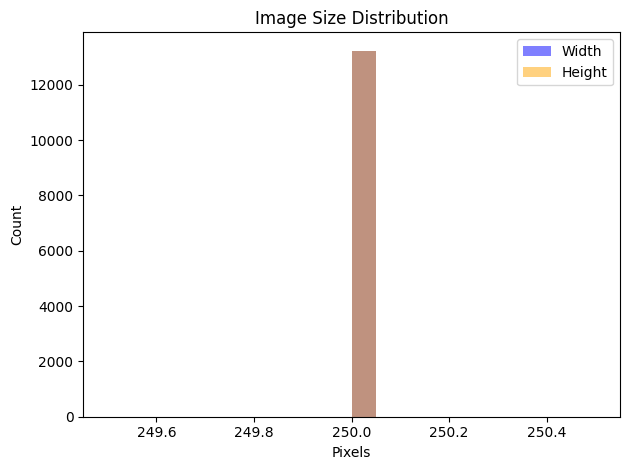

In [ ]:
show_dataset_image_size_distribution(dataset)

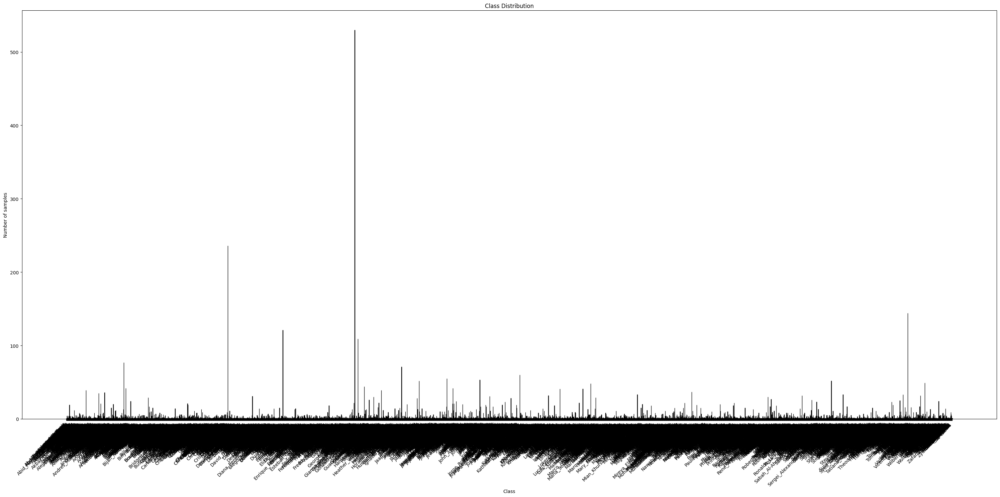

In [ ]:
show_dataset_class_distribution(dataset)

Размеры нормированы, у баланса график выглядит как достойный кандидат в художественную галерею (большинство в пределах 10, несколько в пределах 100, примерно 5 выше, среди которых затесался 1 любитель папараци)

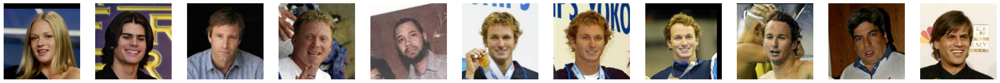

In [ ]:
show_images(dataset, [0,1,2,3,4,5,6,7,8,9,10])

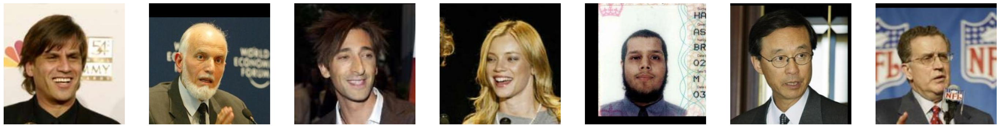

In [ ]:
show_images(dataset, [10,50,100,500,1000,5000,10000])

## Make splits

In [3]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset

# 25% for test
train_indices, test_indices = train_test_split(range(len(dataset)), test_size=0.25, random_state=42)

# 20% for validation
train_indices, val_indices = train_test_split(train_indices, test_size=0.2, random_state=42)

train = Subset(dataset, train_indices)
val = Subset(dataset, val_indices)
test = Subset(dataset, test_indices)


In [4]:
print("Number of training samples:", len(train))
print("Number of val samples:", len(val))
print("Number of test samples:", len(test))

Number of training samples: 7939
Number of val samples: 1985
Number of test samples: 3309


# Preprocess photos

In [5]:
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2

--2025-01-19 10:42:44--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M   154MB/s    in 0.4s    

2025-01-19 10:42:45 (154 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]

bzip2: Output file shape_predictor_68_face_landmarks.dat already exists.


In [6]:
from torchvision.transforms import ToTensor

class ConditionalToTensor:
    def __call__(self, pic):
        if isinstance(pic, torch.Tensor):
            return pic
        return transforms.ToTensor()(pic)


In [7]:
import torch

# transform tensor into [0, 1]
def denormalize_image(tensor, mean, std):
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return torch.clamp(tensor, 0, 1)


In [8]:
import dlib
import numpy as np
from PIL import Image
from torchvision import transforms

# use ready dlib face detector and shape predictor
face_detector = dlib.get_frontal_face_detector()
shape_predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")

def preprocess_image(image_path):
    img = dlib.load_rgb_image(image_path)
    faces = face_detector(img, 1)

    if len(faces) == 0:
        return None                                                               # no face detected

    face = faces[0]                                                               # use the first detected face
    shape = shape_predictor(img, face)
    aligned_face = dlib.get_face_chip(img, shape, size=160)                       # align and resize

    pil_image = Image.fromarray(aligned_face)                                     # convert to PIL

    transform = transforms.Compose([
        ConditionalToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    return transform(pil_image)


In [9]:
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms.functional import to_pil_image

# for visual comparison
def display_images(original_path, processed_image):
    original_image = Image.open(original_path)

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)

    if processed_image is not None:
        plt.imshow(processed_image)
        plt.title("Processed Image")
    else:
        plt.title("No Face Detected")

    plt.axis("off")
    plt.show()


Image preprocessed successfully


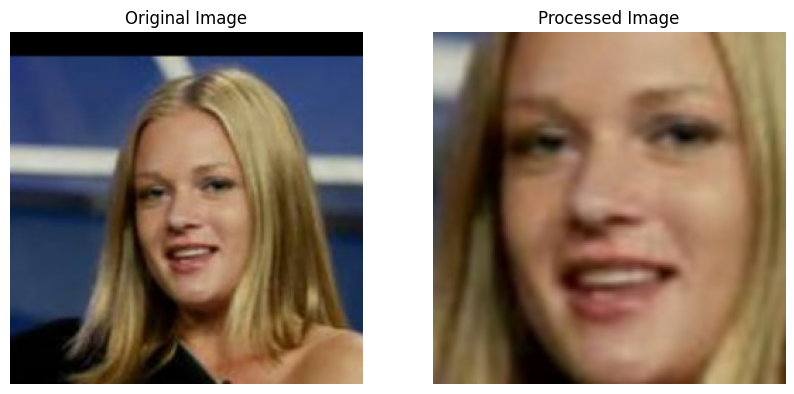

In [19]:
# example of preprocessing
image_path = dataset.samples[0][0]                                                # get path of the first image
processed_image = preprocess_image(image_path)

if processed_image is not None:
    print("Image preprocessed successfully")
else:
    print("No face detected")

display_images(image_path, to_pil_image(denormalize_image(processed_image,
                                                          mean=[0.485, 0.456, 0.406],
                                                          std=[0.229, 0.224, 0.225])))


In [28]:
from torch.utils.data import Dataset

class PreprocessedDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.skipped_images = []                                                  # store paths of skipped images

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        if isinstance(self.dataset, Subset):                                      # indexing the original dataset via subset
            img_path, label = self.dataset.dataset.samples[self.dataset.indices[idx]]
        else:
            img_path, label = self.dataset.samples[idx]

        processed_img = preprocess_image(img_path)

        if processed_img is None:                                                 # return None to skip
            self.skipped_images.append(img_path)
            return None

        return processed_img, label

    def get_skipped_images(self):
        return self.skipped_images


In [29]:
def collate_fn(batch):
    batch = [item for item in batch if item is not None]

    if not batch:                                                                 # if entire batch is empty, return None
        return None

    images, labels = zip(*batch)

    return torch.stack(images), torch.tensor(labels)


In [31]:
train_preprocessed = PreprocessedDataset(train)
val_preprocessed = PreprocessedDataset(val)
test_preprocessed = PreprocessedDataset(test)

train_loader = DataLoader(train_preprocessed, batch_size=32, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_preprocessed, batch_size=32, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_preprocessed, batch_size=32, shuffle=False, collate_fn=collate_fn)

### Check skipped images

Ниже увидим, что dlib не распознает лица в следующих случаях:
1. руки или посторонние предметы прикрывают/покрывают часть лица
2. человек носит головной убор
3. человек носит очки (для зрения или солнцезащитные)
4. изображения заблюрено/зашумлено
5. нестандартный ракурс (в т.ч. голова в профиль)
6. чёлка

In [36]:
skipped_images = train_preprocessed.get_skipped_images()                          # check skipped faces

with open('skipped_images.txt', 'w') as f:
    for img_path in skipped_images:
        f.write(img_path + '\n')

print(f"Skipped {len(skipped_images)} images from train. List is saved into 'skipped_images.txt'")

Skipped 36 images. List is saved into 'skipped_images.txt'


In [56]:
print(f"Skipped {len(val_preprocessed.get_skipped_images())} images from val")
print(f"Skipped {len(test_preprocessed.get_skipped_images())} images from test")

Skipped 5 images from val
Skipped 16 images from test


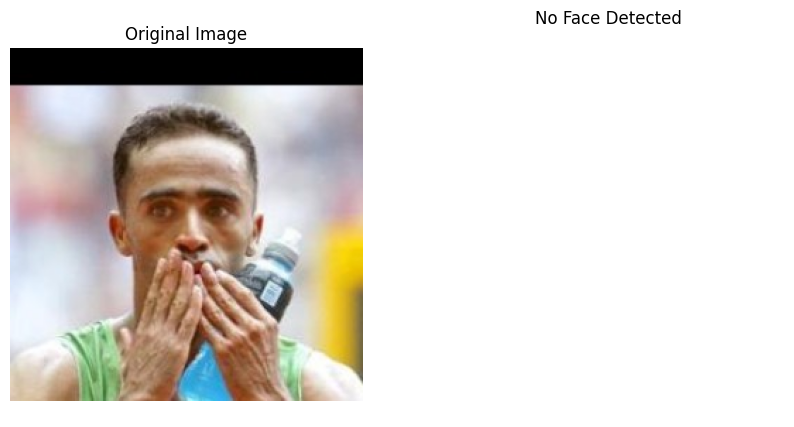

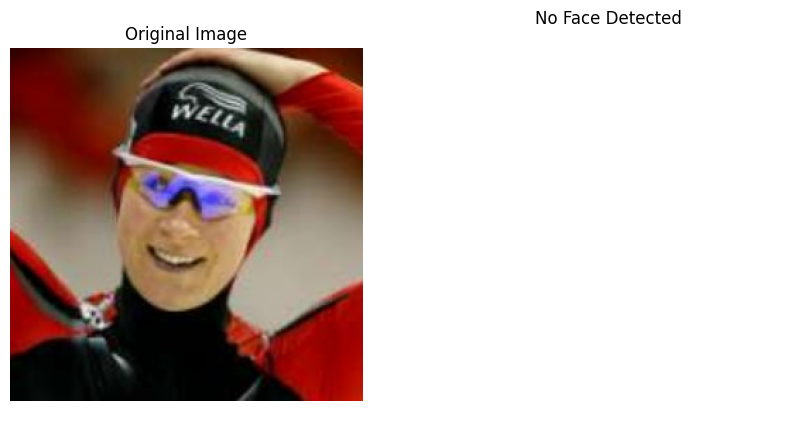

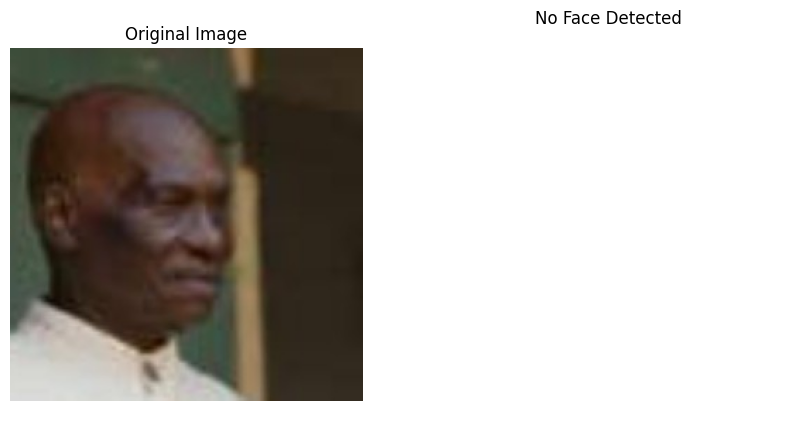

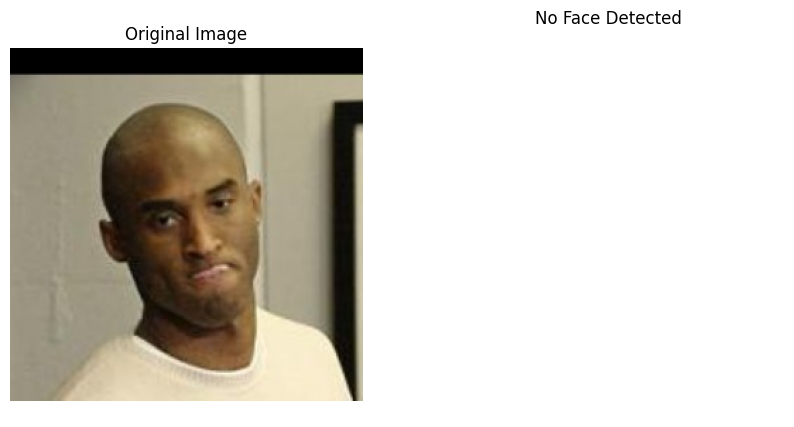

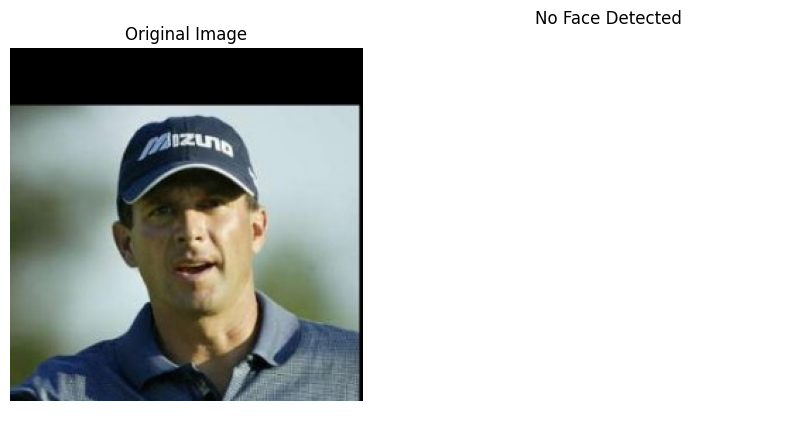

...

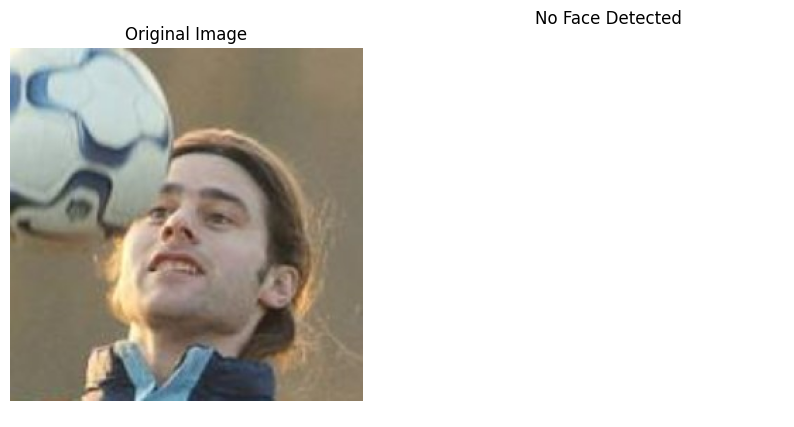

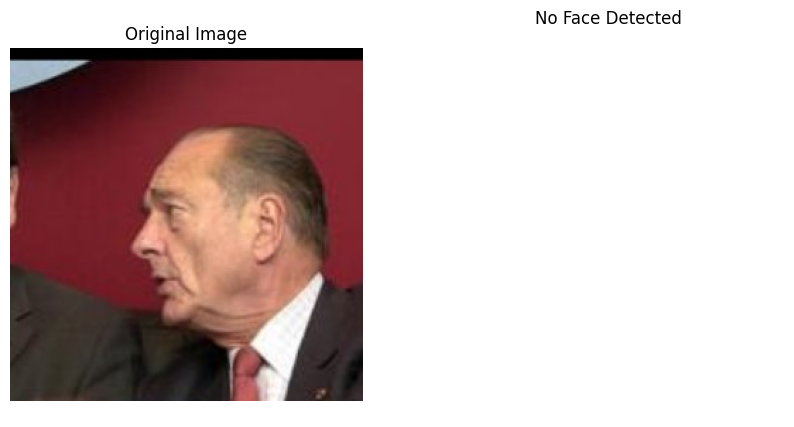

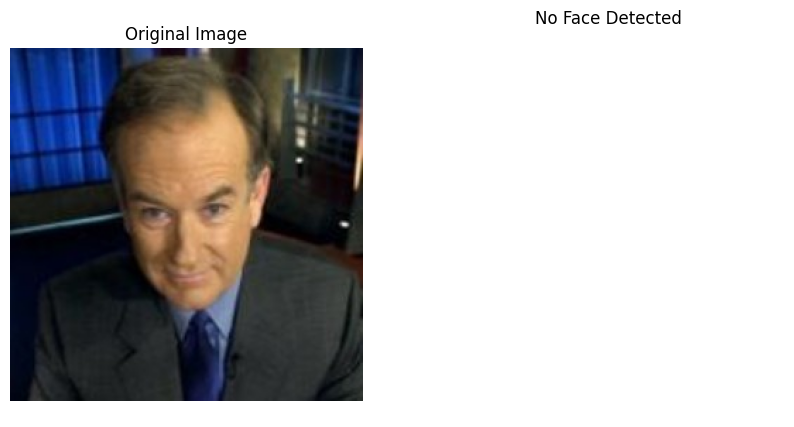

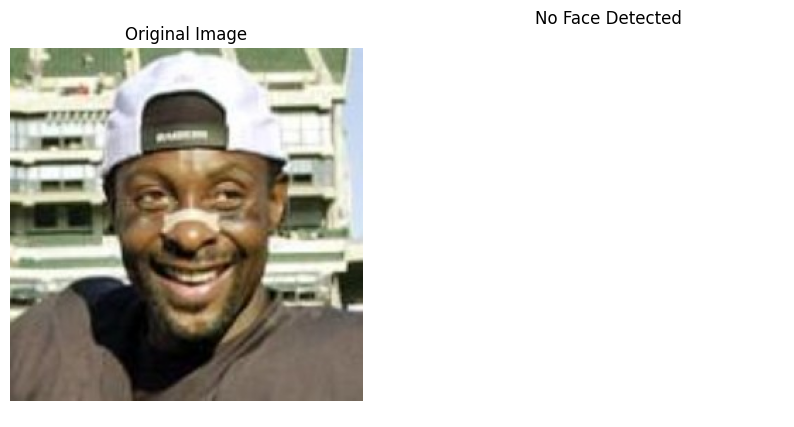

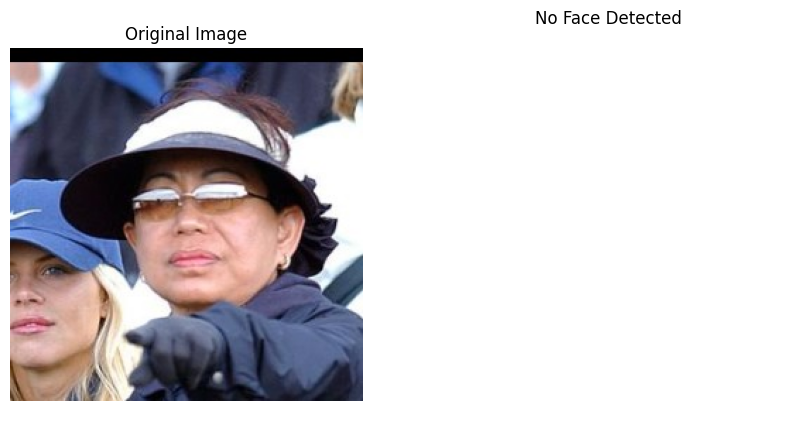

In [55]:
for img_path in skipped_images:
    display_images(img_path, None)

# Convert images into embeddings

You can use pre-trained model or train it by yourself.

В рамках задания воспользуемся предобученной моделю FaceNet: разработана специально для работы с лицами, оптимизирована для извлечения embeddings, основана на облегчённых архитектурах, что делает её быстрее в обучении и использовании

In [13]:
!pip install facenet-pytorch

In [14]:
from facenet_pytorch import InceptionResnetV1
import torch

# use pretrained model FaceNet
device = torch.device('cpu') #('cuda' if torch.cuda.is_available() else 'cpu')
model = InceptionResnetV1(pretrained='vggface2').eval().to(device)

def get_embedding_from_tensor(image_tensor):
    if len(image_tensor.shape) == 3:
        image_tensor = image_tensor.unsqueeze(0)                                  # add batch dimension, if this is one image (3D)

    image_tensor = image_tensor.to(device)

    with torch.no_grad():
        embeddings = model(image_tensor).cpu()                                    # get embeddings for all images in batch
    return embeddings


  0%|          | 0.00/107M [00:00<?, ?B/s]

In [15]:
def extract_embeddings(data_loader, model):
    embeddings_list = []
    labels_list = []

    for batch in data_loader:
        images, labels = batch
        embeddings = get_embedding_from_tensor(images)
        embeddings_list.append(embeddings.cpu().numpy())
        labels_list.append(labels.numpy())

    embeddings_array = np.vstack(embeddings_list)
    labels_array = np.concatenate(labels_list)

    return embeddings_array, labels_array


In [35]:
# get embeddings for all data
train_embeddings, train_labels = extract_embeddings(train_loader, model)
val_embeddings, val_labels = extract_embeddings(val_loader, model)
test_embeddings, test_labels = extract_embeddings(test_loader, model)

28 минут, чтоб наверняка (ну не чудо ли для cpu?..)

In [38]:
!pip install faiss-cpu

In [ ]:
!pip install faiss-gpu

In [118]:
import faiss
import numpy as np

# create FAISS index
index = faiss.IndexFlatL2(train_embeddings.shape[1])                              # L2 - Euclidean metric
index.add(train_embeddings.astype('float32'))                                     # add train embeddings to index

print(f"Index contains {index.ntotal} vectors")


Index contains 7903 vectors


In [40]:
faiss.write_index(index, "lfw_face_index.faiss")

In [49]:
loaded_index = faiss.read_index("lfw_face_index.faiss")

In [119]:
# upd

upd_index = faiss.IndexFlatL2(train_embeddings.shape[1])

# IndexIDMap wrapping
id_index = faiss.IndexIDMap(upd_index)

# add embeddings with unique labels
id_index.add_with_ids(train_embeddings.astype('float32'), train_labels.astype('int64'))

print(f"Index contains  {id_index.ntotal} vectors")

# save index with labels
faiss.write_index(id_index, "lfw_face_index_with_labels.faiss")

Index contains  7903 vectors


# Evaluate the results



## Calculate metrics

- Check case where person's photo doesn't exist in embedding DB
- It's recommended to use [PML](https://github.com/KevinMusgrave/pytorch-metric-learning)

In [41]:
!pip install pytorch-metric-learning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 kB 4.7 MB/s eta 0:00:00


In [59]:
from pytorch_metric_learning.utils.accuracy_calculator import AccuracyCalculator

# Put your code here

# check lengths of embeddings and labels
assert len(train_embeddings) == len(train_labels), "Train embeddings and labels must have the same length"
assert len(val_embeddings) == len(val_labels), "Validation embeddings and labels must have the same length"
assert len(train_embeddings) == len(train_labels), "Training embeddings and labels must have the same length"

accuracy_calculator = AccuracyCalculator(include=("precision_at_1", "mean_average_precision", "r_precision"))

# metrics = accuracy_calculator.get_accuracy(val_embeddings, train_embeddings, val_labels, train_labels)
# ValueError: embeddings and labels must have the same length ???


In [67]:
# calculate accuracy using the query and training embeddings
def calculate_accuracy(query_embeddings, query_labels, train_labels, index):
    correct = 0
    total = len(query_embeddings)

    for i in range(total):
        query_embedding = np.array([query_embeddings[i]], dtype=np.float32)
        distances, indices = index.search(query_embedding, 1)
        predicted_label = train_labels[indices[0][0]]

        if query_labels[i] == predicted_label:
            correct += 1

    return correct / total


In [168]:
import numpy as np

def calculate_metrics_at_threshold(query_embeddings, query_labels, train_labels, index, threshold=0.1):
    true_positive = 0
    false_positive = 0
    false_negative = 0
    total = len(query_embeddings)

    for i in range(total):
        query_embedding = np.array([query_embeddings[i]], dtype=np.float32)
        distances, indices = index.search(query_embedding, 1)
        predicted_label = train_labels[indices[0][0]]

        if query_labels[i] == predicted_label:
            true_positive += 1
        else:
            if distances[0][0] < threshold:
                false_positive += 1
            else:
                false_negative += 1

    # formula
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    return precision, recall, f1

def print_metrics_at_threshold(query_embeddings, query_labels, train_embeddings, train_labels, index, threshold=0.1):
    precision, recall, f1 = calculate_metrics_at_threshold(query_embeddings, query_labels, train_labels, index, threshold)

    print(f"Metrics at threshold {threshold}:")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1:.4f}")


In [68]:
import numpy as np

def search_face(embedding, labels, faiss_index, image, threshold=0.1):
    if embedding is None:
        raise ValueError("Embedding must not be None")

    # ensure the embedding is a 2D NumPy array of dtype float32
    query_embedding = np.array([embedding], dtype=np.float32)                     # wrap embedding in an extra dimension

    # use FAISS to search for the closest neighbor
    distances, indices = faiss_index.search(query_embedding, 1)                   # search for 1 nearest neighbor

    # check if the closest match is within the threshold
    if distances[0][0] < threshold:
        return labels[indices[0][0]]

    return None


In [112]:
print(f"Accuracy val: {calculate_accuracy(val_embeddings, val_labels, train_labels, loaded_index):.5f}")

Accuracy val: 0.54192


In [165]:
print_metrics_at_threshold(val_embeddings, val_labels, train_embeddings, train_labels, loaded_index, threshold=0.1)

Metrics at threshold 0.1:
Precision: 0.9991
Recall: 0.5422
F1-score: 0.7029


In [114]:
print(f"Accuracy test: {calculate_accuracy(test_embeddings, test_labels, train_labels, loaded_index):.5f}")

Accuracy test: 0.55815


In [166]:
print_metrics_at_threshold(test_embeddings, test_labels, train_embeddings, train_labels, loaded_index, threshold=0.1)

Metrics at threshold 0.1:
Precision: 0.9967
Recall: 0.5592
F1-score: 0.7164


Found person: 448


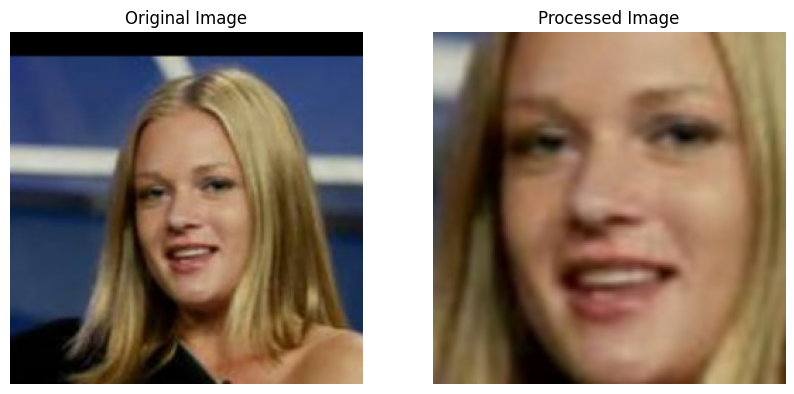

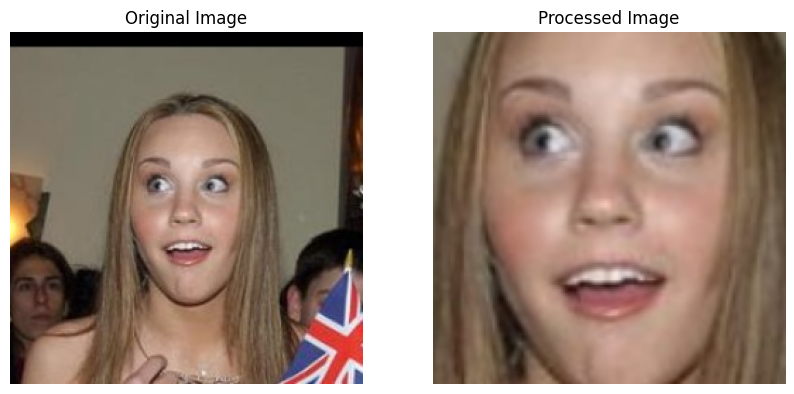

In [116]:
# test face search

image_path = dataset.samples[0][0]
image_to_search = Image.open(image_path)

person_name = search_face(train_embeddings[0], train_labels, loaded_index, image_to_search)
print(f"Found person: {person_name}")

display_images(image_path, to_pil_image(denormalize_image(preprocess_image(image_path),
                                                          mean=[0.485, 0.456, 0.406],
                                                          std=[0.229, 0.224, 0.225])))
found_image_path = dataset.samples[person_name][0]

display_images(found_image_path, to_pil_image(denormalize_image(preprocess_image(found_image_path),
                                                          mean=[0.485, 0.456, 0.406],
                                                          std=[0.229, 0.224, 0.225])))

Возможно, это совпадение, но по идее похожи

## Plot the DET curve

In [86]:
import matplotlib.pyplot as plt

def plot_det_curve(query_embeddings, query_labels, train_embeddings, train_labels, index, thresholds=np.linspace(0, 1, 100)):
    fpr = []
    fnr = []

    for threshold in thresholds:
        true_positive = 0
        false_positive = 0
        false_negative = 0
        total = len(query_embeddings)

        for i in range(total):
            query_embedding = np.array([query_embeddings[i]], dtype=np.float32)
            distances, indices = index.search(query_embedding, 1)
            predicted_label = train_labels[indices[0][0]]

            if query_labels[i] == predicted_label:
                true_positive += 1
            else:
                if distances[0][0] < threshold:
                    false_positive += 1
                else:
                    false_negative += 1

        fpr.append(false_positive / (false_positive + true_positive))             # FP / (FP + TP)
        fnr.append(false_negative / (false_negative + true_positive))             # FN / (FN + TP)

    plt.plot(fpr, fnr, label='DET Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('False Negative Rate')
    plt.title('DET Curve')
    plt.legend()
    plt.grid(True)
    plt.show()


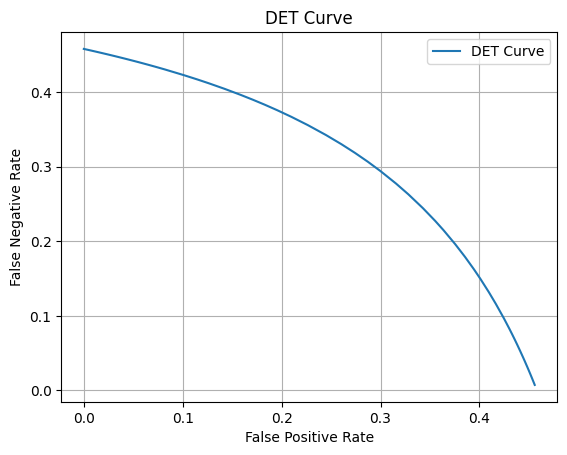

In [88]:
# Plot DET curve for val
plot_det_curve(val_embeddings, val_labels, train_embeddings, train_labels, loaded_index)

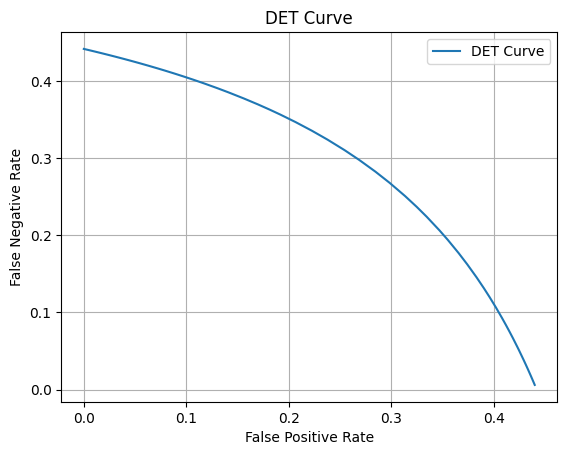

In [87]:
# Plot DET curve for test
plot_det_curve(test_embeddings, test_labels, train_embeddings, train_labels, loaded_index)

# Implement class for face search

You can use faiss: https://github.com/facebookresearch/faiss

In [167]:
from facenet_pytorch import InceptionResnetV1
import torch
import faiss
import numpy as np
from PIL import Image
from torchvision import transforms

# just adapt functions written above for entire class
class FaceSearch(object):
    def __init__(self, threshold = 0.7):
        self.threshold = threshold
        self.face_detector = dlib.get_frontal_face_detector()
        self.shape_predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
        self.device = torch.device('cpu') #('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = InceptionResnetV1(pretrained='vggface2').eval().to(self.device)
        self.faiss_index = faiss.read_index("lfw_face_index_with_labels.faiss")

        # extract labels
        if isinstance(self.faiss_index, faiss.IndexIDMap):
            self.index_labels = faiss.vector_to_array(self.faiss_index.id_map)
        else:
            raise ValueError("Index does not contains ID-map")

    def get_embedding_from_tensor(self, image_tensor):
        if len(image_tensor.shape) == 3:
            image_tensor = image_tensor.unsqueeze(0)

        image_tensor = image_tensor.to(self.device)

        with torch.no_grad():
            embeddings = self.model(image_tensor).cpu()

        return embeddings

    def preprocess_image(self, input_image):
        if isinstance(input_image, str):
            img = dlib.load_rgb_image(input_image)
        elif isinstance(input_image, Image.Image):                                # сonvert PIL.Image to numpy format for work with dlib
            img = np.array(input_image)
        else:
            raise ValueError("Input must be a file path or a PIL.Image object")

        faces = self.face_detector(img, 1)

        if len(faces) == 0:
            return None

        face = faces[0]
        shape = self.shape_predictor(img, face)
        aligned_face = dlib.get_face_chip(img, shape, size=160)

        pil_image = Image.fromarray(aligned_face)

        transform = transforms.Compose([
            ConditionalToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

        return transform(pil_image)

    def get_embedding_from_image(self, image):
        processed_image = self.preprocess_image(image)

        if processed_image is None:
            print(f"Face not found {image_path}")
            return None

        embedding = self.get_embedding_from_tensor(processed_image)

        if embedding is None:
            print(f"Cannot get embedding for image {image}")
            return None

        return embedding.cpu().detach().numpy().flatten()

    def search_face(self, image):
        embedding = self.get_embedding_from_image(image)

        query_embedding = np.array([embedding], dtype=np.float32)
        distances, indices = self.faiss_index.search(query_embedding, 1)

        if distances[0][0] < self.threshold:
            return self.index_labels[indices[0][0]]

        print(f"Cannot get prediction for image {image} with threshold = {self.threshold} and distances[0][0] = {distances[0][0]}")

        return None

    def __call__(self, image):
      return self.search_face(image)


## Demonstrate result on photos from CFPW dataset

http://www.cfpw.io/

Basically, you shouldn't change the following code, just run it

In [121]:
!wget -nc http://www.cfpw.io/cfp-dataset.zip
!unzip cfp-dataset.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: cfp-dataset/Data/Images/210/profile/03.jpg  
  inflating: cfp-dataset/Data/Images/210/profile/04.jpg  
   creating: cfp-dataset/Data/Images/211/
   creating: cfp-dataset/Data/Images/211/frontal/
  inflating: cfp-dataset/Data/Images/211/frontal/01.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/02.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/03.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/04.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/05.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/06.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/07.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/08.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/09.jpg  
  inflating: cfp-dataset/Data/Images/211/frontal/10.jpg  
   creating: cfp-dataset/Data/Images/211/profile/
 extracting: cfp-dataset/Data/Images/211/profile/01.jpg  
  inflating: cfp-dataset/Data/Images

In [158]:
from glob import glob
from pathlib import Path
from torch.utils.data import Dataset
from PIL import Image
import matplotlib.pyplot as plt
import os

class CFPWDataset(Dataset):  # CFPWDataset wrapper
  def __init__(self, root = "cfp-dataset", transform = None):
    self.paths = glob(f"{root}/Data/Images/**/frontal/*")
    self.paths.sort()
    self.transform = transform
    with open(f"{root}/Data/list_name.txt", 'r') as file:
      self.names =  file.readlines()

  def path2id(self, path):
    parts = path.split(os.sep)
    return int(parts[-3])

  def id2name(self,id):
    assert id < len(self.names)
    return self.names[id]

  def __len__(self):
    return len(self.paths)

  def __getitem__(self, n):
    path = self.paths[n]
    img = Image.open(path)
    if self.transform:
      img = self.transform(img)
    id = self.path2id(path)
    name = self.id2name(id)
    return img, name


Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=528x492 at 0x7F02E0725250> with threshold = 0.7 and distances[0][0] = 0.7982848882675171
Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=260x219 at 0x7F02E2B31A10> with threshold = 0.7 and distances[0][0] = 0.7758106589317322
Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=248x232 at 0x7F02E1D40710> with threshold = 0.7 and distances[0][0] = 0.8622425198554993
Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=281x246 at 0x7F02E1EAA110> with threshold = 0.7 and distances[0][0] = 0.7632156610488892
Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=151x188 at 0x7F02E22B5C50> with threshold = 0.7 and distances[0][0] = 0.8274962902069092
Cannot get prediction for image <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=167x208 at 0x7F02E1CE3C50> with t

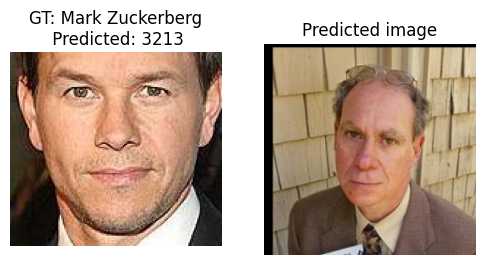

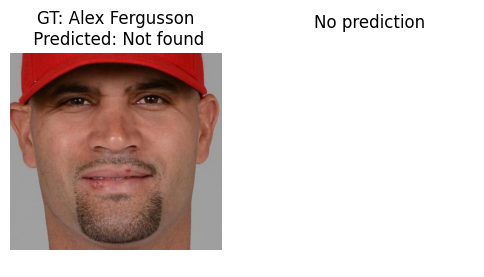

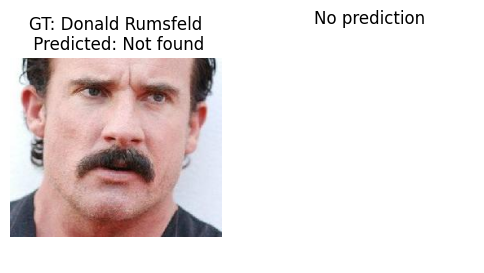

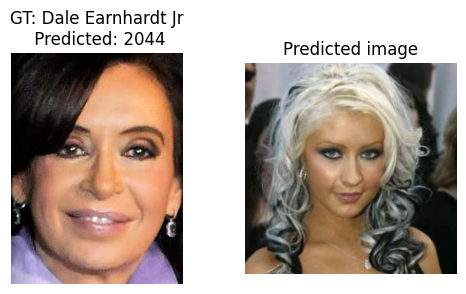

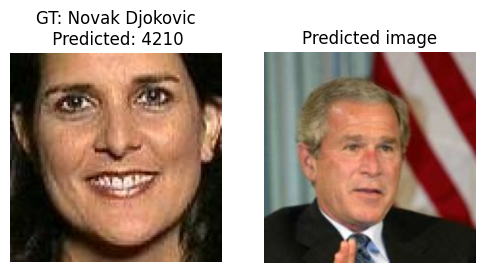

...

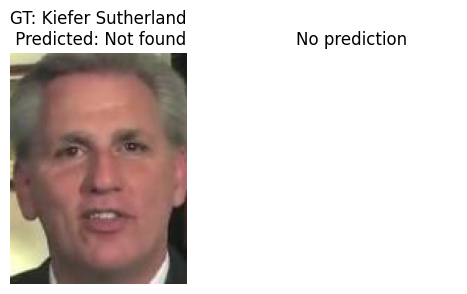

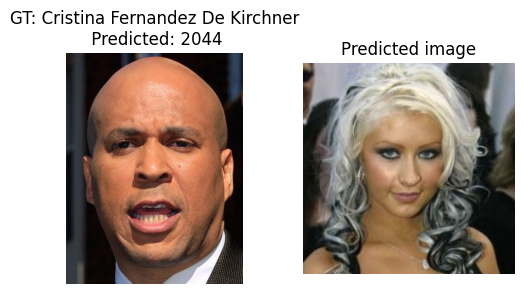

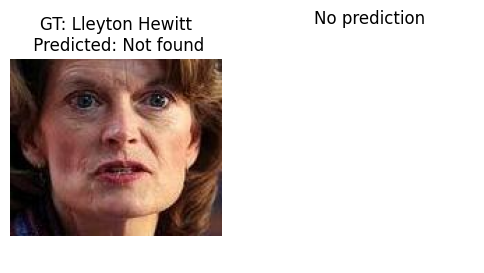

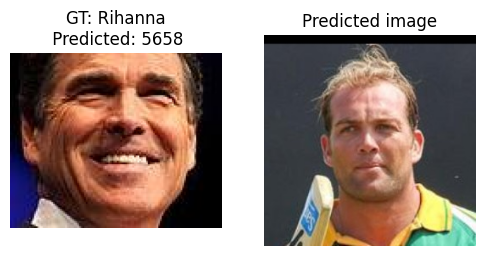

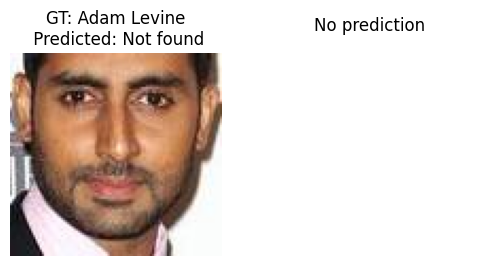

In [162]:
import random

ds = CFPWDataset()

random.seed(42)
random_samples = random.choices(range(0, len(ds)), k=20)

searcher = FaceSearch()

for i in random_samples:
  img, name = ds[i]
  prediction = searcher(img)
  prediction = prediction if prediction is not None else "Not found"

  # for visual debug
  if prediction != "Not found":
      predicted_img = Image.open(dataset.samples[prediction][0])
  else:
      predicted_img = None

  plt.figure(figsize=(6, 3))

  # original
  plt.subplot(1, 2, 1)
  plt.title(f"GT: {name} Predicted: {prediction}")
  plt.axis('off')
  plt.imshow(img)

  # prediction from lfw dataset
  if predicted_img is not None:
      plt.subplot(1, 2, 2)
      plt.title(f"Predicted image")
      plt.axis('off')
      plt.imshow(predicted_img)
  else:
      plt.subplot(1, 2, 2)
      plt.title(f"No prediction")
      plt.axis('off')

plt.show()


#Place for conclusion

Сложно сказать... местами черты похожи, а где-то возникают вопросики. При этом понадобилось повысить порог до 0.7, чтобы получилось больше картинок предсказать (актуально для другого датасета, в рамках LFW порог 0.1). Возможно, надо было использовать вложения с предложенного датасета, но в параметры класса он не передавался, а неизменяемый код я потрогала только для добавления визуализации

Ещё валидационная выборка от тестовой у меня не отличалась, хотя на val условно можно было потестить инструмент optuna с подбором гиперпараметров (или проверить там ещё модель resnet, которая на лица не заточена изначально)

Использовались:
1. модель FaceNet, основанная на InceptionResnetV1 с предобучением на наборе данных VGGFace2
2. выравнивание лиц с использованием dlib
3. оптимизация Faiss с индексом на основе L2 метрики для ускорения поиска ближайших соседей

Метрики для test выборки (да, они лучше, чем у val, т.к. размер выборки выше на 5%):
1. Accuracy ≈ 0.558
2. F1-score ≈ 0.716 (вроде приемлемый баланс)

В работе не было проведено множества экспериментов с подбором гиперпараметров, однако использовалась FaceNet, специально обученная для работы с лицами, что могло повлиять на результаты. Предположу, что если бы это была универсальная модель (например ResNet), получение такого F1-score было бы сложнее из-за отсутствия встроенной специфической оптимизации